In [2]:

import h5py
import numpy as np
import matplotlib.pyplot as plt
os.chdir('/local/crv/acanberk/folding-unfolding/src')
from learning.utils import deformable_distance
import pandas as pd
os.chdir('/local/crv/acanberk/folding-unfolding/src')
from learning.utils import deformable_distance
from scipy.spatial.transform import Rotation as R
from scipy.ndimage import rotate
import seaborn as sns
import cv2

input_paths = {
    'gt':'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/gt/replay_buffer.hdf5',
    'unfactorized':'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/unfactorized/replay_buffer.hdf5',
    'factorized':'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/factorized/replay_buffer.hdf5',
    'fling':'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/fling/replay_buffer.hdf5',
    'garbage':'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/garbage/replay_buffer.hdf5'

}
# gt_path = '/local/crv/acanberk/folding-unfolding/src/test-fold-gt/replay_buffer.hdf5'

# stats = {path: {} for path in input_paths}


def collect_data(group):

    instance_query = int(np.array(group['init_verts']).shape[0])
    mask = np.array(group['postaction_curr_mask'])
    init_mask = np.array(group['postaction_init_mask'])
    curr_verts = np.array(group['postaction_verts'])
    preaction_verts = np.array(group['preaction_verts'])
    pretransform_image = group['pretransform_observations'][:3].transpose(1,2,0)
    image = group['next_observations'][:3].transpose(1,2,0)
    init_verts = np.array(group['init_verts'])
    area = (init_verts[0].max() - init_verts[0].min()) * (init_verts[2].max() - init_verts[2].min())

    retval = {
        'instance_query':instance_query,
        'mask':mask,
        'verts':curr_verts,
        'preaction_verts':preaction_verts,
        'image':image,
        'pretransform_image':pretransform_image,
        'init_verts':init_verts,
        'area':area,
        'init_mask':init_mask
    }
    return retval




print("Collecting gt data...")
gt_data = {}
path = input_paths['gt']
with h5py.File(path, 'r') as dataset:
    keys = [k for k in list(dataset.keys()) if 'last' in k]
    print("Length of gt keys", len(keys))
    for i, key in enumerate(keys):
        data = collect_data(dataset[key])
        if np.sum(np.logical_xor(data['pretransform_image'].sum(axis=-1), data['init_mask'])) > 10000:
            continue

        gt_data[data['instance_query']] = data

print("Collecting cloth data...")
cloth_data = []
for name, path in input_paths.items():
    print("Collecting from", path)
    with h5py.File(path, 'r') as dataset:
        keys = [k for k in list(dataset.keys()) if 'last' in k]
        for key in keys:
            group = dataset[key]

            episode_data = collect_data(group)
            try:
                gt_instance_data = gt_data[episode_data['instance_query']]
            except:
                print("Query could not be found")
                continue


            mask = episode_data['mask']
            verts = episode_data['verts']
            preaction_verts = episode_data['preaction_verts']
            area = episode_data['area']
            image = episode_data['image']

            gt_mask = gt_instance_data['mask']
            gt_verts = gt_instance_data['verts']
            gt_area = gt_instance_data['area']
            gt_image = gt_instance_data['image']
            gt_preaction_verts = gt_instance_data['preaction_verts']

            def get_edges(im):
                im = np.ascontiguousarray(im.copy() * 255).astype(np.uint8) 
                contours, hierarchy = cv2.findContours(im,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
                out = np.zeros((480, 480)).astype(np.uint8)
                out = cv2.drawContours(out, contours, -1, 255, 3)
                return np.array(out).astype(float)/255

            gt_outline = get_edges(gt_mask)


            if name == 'gt' and (np.sum(np.logical_xor(episode_data['pretransform_image'].sum(axis=-1), episode_data['init_mask'])) > 10000):
                continue

            if name == 'fling' or name == 'garbage':

                results = []
                for rot_candidate in np.linspace(0, 2 * np.pi, 8):
                    rotation_matrix = R.from_rotvec(rot_candidate * np.array([0, 1, 0])).as_matrix()
                    preaction_rotated_verts =  preaction_verts.copy() @ rotation_matrix
                    _, _, _, preaction_l2_distance, _ = deformable_distance(gt_preaction_verts, preaction_rotated_verts, max_coverage=gt_area)
                    results.append([preaction_l2_distance, rot_candidate])
                results.sort()

                _, rot = results[0]
                rotation_matrix = R.from_rotvec(rot * np.array([0, 1, 0])).as_matrix()
                rotated_verts = verts.copy() @ rotation_matrix
                weighted_distance, deform_distance, rigid_distance, l2_distance , _ = deformable_distance(gt_verts, rotated_verts, max_coverage=gt_area)

                rotated_mask = rotate(mask.copy(), -rot * (180/np.pi), reshape=False)

                iou = np.sum(np.logical_and(rotated_mask, gt_mask))/np.sum(np.logical_or(rotated_mask, gt_mask))


                for k, value in episode_data.items():
                    if 'image' in k:
                        episode_data[k] = rotate(value.copy(), -rot * (180/np.pi), reshape=False)

            else:   
                                
                weighted_distance, deform_distance, rigid_distance, l2_distance , _ = deformable_distance(gt_verts, verts, max_coverage=gt_area)
                iou = np.sum(np.logical_and(mask, gt_mask))/np.sum(np.logical_or(mask, gt_mask))
                rot = -1

            # # print(iou)
            # if l2_distance > 4:
            #     fig, axs = plt.subplots(1, 4)
            #     axs[0].imshow(image)
            #     axs[1].imshow(episode_data['pretransform_image'])
            #     axs[2].imshow(gt_image)
            #     axs[3].imshow(gt_instance_data['pretransform_image'])
            #     plt.show()

            episode_data['iou'] = iou
            episode_data['weighted_distance'] = weighted_distance
            episode_data['deformable_distance'] = deform_distance
            episode_data['rigid_distance'] = rigid_distance
            episode_data['l2_distance'] = l2_distance

            episode_data['name'] = name
            episode_data['path'] = path
            episode_data['key'] = key
            episode_data['rot'] = rot
            episode_data['gt_mask'] = gt_outline


            cloth_data.append(episode_data)

            # plt.imshow(episode_data['pretransform_image'])
            # plt.show()
            # plt.imshow(episode_data['image'])
            # plt.show()


cloth_data = pd.DataFrame(cloth_data)
cloth_data.head()


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Length of gt keys 190


,instance_query,mask,verts,preaction_verts,image,pretransform_image,init_verts,area,init_mask,iou,weighted_distance,deformable_distance,rigid_distance,l2_distance,name,path,key,rot,gt_mask
0,5820,"[[False, False, False, False, False, False, Fa...","[[0.0070516, 0.007000004, 0.23625757], [0.0071...","[[0.0070997905, 0.007002123, 0.27467364], [0.0...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.007393406, 0.007, 0.27361295], [0.00738136...",0.062272,"[[False, False, False, False, False, False, Fa...",0.661105,0.261245,0.272745,0.239889,0.368476,gt,/local/crv/acanberk/folding-unfolding/src/down...,000000000_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,7612,"[[False, False, False, False, False, False, Fa...","[[0.0017661782, 0.007, 0.29997712], [0.2149891...","[[0.0052969567, 0.007, 0.31675118], [0.2171725...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.0053516272, 0.007, 0.31674707], [0.2166404...",0.090749,"[[False, False, False, False, False, False, Fa...",0.945371,0.019506,0.025483,0.008408,0.026112,gt,/local/crv/acanberk/folding-unfolding/src/down...,000000001_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,6236,"[[False, False, False, False, False, False, Fa...","[[0.0026687735, 0.007, 0.29003048], [0.0024184...","[[0.0018959076, 0.007, 0.29436266], [0.0019639...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.001911175, 0.007, 0.29430076], [0.00198626...",0.073153,"[[False, False, False, False, False, False, Fa...",0.875039,0.064342,0.072300,0.049563,0.078290,gt,/local/crv/acanberk/folding-unfolding/src/down...,000000002_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,6748,"[[False, False, False, False, False, False, Fa...","[[0.00015745369, 0.0070005627, 0.26939481], [0...","[[0.0027645899, 0.007, 0.26693192], [0.0031774...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.0024750312, 0.007, 0.26696953], [0.0027513...",0.059629,"[[False, False, False, False, False, False, Fa...",0.915486,0.045258,0.050229,0.036025,0.057877,gt,/local/crv/acanberk/folding-unfolding/src/down...,000000003_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,6424,"[[False, False, False, False, False, False, Fa...","[[0.006630207, 0.007, 0.27290097], [0.00643505...","[[0.0068573356, 0.007, 0.27269292], [0.0065789...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.006607055, 0.007, 0.27273268], [0.00630634...",0.059800,"[[False, False, False, False, False, False, Fa...",0.848214,0.086529,0.083154,0.092796,0.105880,gt,/local/crv/acanberk/folding-unfolding/src/down...,000000004_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


941

gt
iou:0.86 +- 0.01
l2_distance:0.11 +- 0.01
deformable_distance:0.09 +- 0.01
rigid_distance:0.07 +- 0.00
success: 1.000 +- 0.00

unfactorized
iou:0.62 +- 0.01
l2_distance:0.45 +- 0.03
deformable_distance:0.25 +- 0.01
rigid_distance:0.37 +- 0.03
success: 0.849 +- 0.03

factorized
iou:0.64 +- 0.01
l2_distance:0.43 +- 0.02
deformable_distance:0.25 +- 0.01
rigid_distance:0.37 +- 0.02
success: 0.878 +- 0.02

fling
iou:0.32 +- 0.01
l2_distance:0.92 +- 0.04
deformable_distance:0.49 +- 0.01
rigid_distance:0.85 +- 0.04
success: 0.196 +- 0.03

garbage
iou:0.17 +- 0.01
l2_distance:1.23 +- 0.05
deformable_distance:0.52 +- 0.01
rigid_distance:1.18 +- 0.05
success: 0.021 +- 0.01


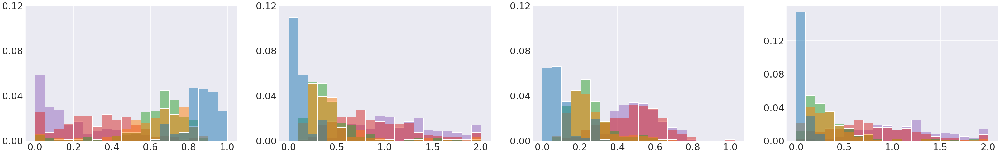

In [5]:
import matplotlib.ticker as mtick


cloth_data.head() 
# print(cloth_data)
metrics = ['iou', 'l2_distance', 'deformable_distance', 'rigid_distance']
# metrics = ['l2_distance', 'deformable_distance']


size_factor = 8
fig, axs = plt.subplots(1, len(metrics), figsize=((len(metrics)+3)*size_factor, size_factor))

# select_cloth_data = cloth_data[(cloth_data.name == 'factorized') | (cloth_data.name == 'fling')]
select_cloth_data = cloth_data

name_to_label = {
    'fling':'FlingBot',
    'factorized':'Ours'
}
print(len(select_cloth_data['name']))

for i, metric in enumerate(metrics):
    try:
        ax = axs[i]
        flattened = axs.flat
    except:
        ax = axs
        flattened = axs
    sns.histplot(data=cloth_data, x=np.clip(select_cloth_data[metric], 0, 2), hue=select_cloth_data['name'], ax=ax, stat='probability', bins=20, legend=False)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

SUCCESS_THRESH = 0.35
for name in cloth_data.name.unique():
    print(f"\n{name}")
    for metric in metrics:
        print(f"{metric}:{cloth_data[cloth_data.name == name][metric].mean():.3f} +- {cloth_data[cloth_data.name == name][metric].std()/np.sqrt(len(cloth_data[cloth_data.name == name])):.2f}" )
    print(f"success: {(cloth_data[cloth_data.name == name]['deformable_distance'] < SUCCESS_THRESH).mean():.3f} +- {(cloth_data[cloth_data.name == name]['deformable_distance'] < SUCCESS_THRESH).std()/np.sqrt(len(cloth_data[cloth_data.name == name])):.2f}" )
#less ticks more gridlines
sns.set_style("darkgrid")

# axs.yaxis.set_major_formatter(mtick.PercentFormatter())
for ax in flattened:
    ax.set_xlabel('')
    ax.set_ylabel('')


# plt.legend(loc='upper right', labels=['Fling', 'Ours'], fontsize=20)
#delete legend

#fewer y ticks
for ax in axs.flat:
    ax.set_yticks(np.linspace(0, 0.12, 4))


#make ticks bigger
for ax in axs.flat:
    ax.tick_params(axis='both', which='major', labelsize=30)
    ax.tick_params(axis='both', which='minor', labelsize=30)

plt.show()

In [ ]:
select_cloth_data.head()

,instance_query,mask,verts,preaction_verts,image,pretransform_image,init_verts,area,init_mask,iou,weighted_distance,deformable_distance,rigid_distance,l2_distance,name,path,key,rot,gt_mask
181,5720,"[[False, False, False, False, False, False, Fa...","[[0.2325819, 0.12084834, 0.018016996], [0.2447...","[[-0.009725111, 0.10414943, -0.059138566], [8....","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.006058908, 0.007, 0.25340676], [0.00608334...",0.050903,"[[False, False, False, False, False, False, Fa...",0.030052,0.858575,0.488432,1.545983,1.507748,factorized,/local/crv/acanberk/folding-unfolding/src/down...,000000000_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
182,5820,"[[False, False, False, False, False, False, Fa...","[[0.021229524, 0.007, 0.25958157], [0.01331214...","[[0.022066517, 0.007, 0.2575083], [0.016552996...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.0073042354, 0.007, 0.27386504], [0.0072683...",0.063103,"[[False, False, False, False, False, False, Fa...",0.632834,0.281250,0.301170,0.244255,0.369967,factorized,/local/crv/acanberk/folding-unfolding/src/down...,000000001_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
183,5820,"[[False, False, False, False, False, False, Fa...","[[0.124682166, 0.020458179, 0.23344564], [0.12...","[[0.12820879, 0.02508422, 0.21326795], [0.1248...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.007330361, 0.007001224, 0.27433878], [0.00...",0.062670,"[[False, False, False, False, False, False, Fa...",0.563221,0.522625,0.384451,0.779234,0.831851,factorized,/local/crv/acanberk/folding-unfolding/src/down...,000000002_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
184,6236,"[[False, False, False, False, False, False, Fa...","[[-0.05330048, 0.007, 0.1678147], [-0.06951487...","[[-0.052785248, 0.008686957, 0.2361403], [-0.0...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.0015603574, 0.0070042927, 0.29432106], [0....",0.073314,"[[False, False, False, False, False, False, Fa...",0.675687,0.163567,0.142105,0.203424,0.243478,factorized,/local/crv/acanberk/folding-unfolding/src/down...,000000003_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
185,6364,"[[False, False, False, False, False, False, Fa...","[[0.052968215, 0.007, 0.27124304], [0.04838185...","[[0.047911316, 0.0070199245, 0.27673554], [0.0...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...","[[0.00180841, 0.007, 0.28857028], [0.001421763...",0.072092,"[[False, False, False, False, False, False, Fa...",0.664987,0.204466,0.211784,0.190875,0.272960,factorized,/local/crv/acanberk/folding-unfolding/src/down...,000000004_step00_last,-1.0,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [ ]:
comparison_keys = {}
for row in select_cloth_data.itertuples():
    if row.instance_query not in comparison_keys:
        comparison_keys[row.instance_query] = {}
    if row.name not in comparison_keys[row.instance_query]:
        comparison_keys[row.instance_query][row.path] = []
    comparison_keys[row.instance_query][row.path].append(row.key)

In [ ]:
print(comparison_keys)

{5720: {'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/factorized/replay_buffer.hdf5': ['000000194_step00_last'], '/local/crv/acanberk/folding-unfolding/src/downstream_experiments/fling/replay_buffer.hdf5': ['000000196_step00_last']}, 5820: {'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/factorized/replay_buffer.hdf5': ['000000184_step00_last'], '/local/crv/acanberk/folding-unfolding/src/downstream_experiments/fling/replay_buffer.hdf5': ['000000201_step00_last']}, 6236: {'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/factorized/replay_buffer.hdf5': ['000000187_step00_last'], '/local/crv/acanberk/folding-unfolding/src/downstream_experiments/fling/replay_buffer.hdf5': ['000000193_step00_last']}, 6364: {'/local/crv/acanberk/folding-unfolding/src/downstream_experiments/factorized/replay_buffer.hdf5': ['000000195_step00_last'], '/local/crv/acanberk/folding-unfolding/src/downstream_experiments/fling/replay_buffer.hdf5': ['000000203_ste

WARNING - 2022-09-02 17:25:00,164 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:01,419 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:02,635 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:04,087 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:05,459 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:06,815 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:08,219 - image - Clipping input data to the valid

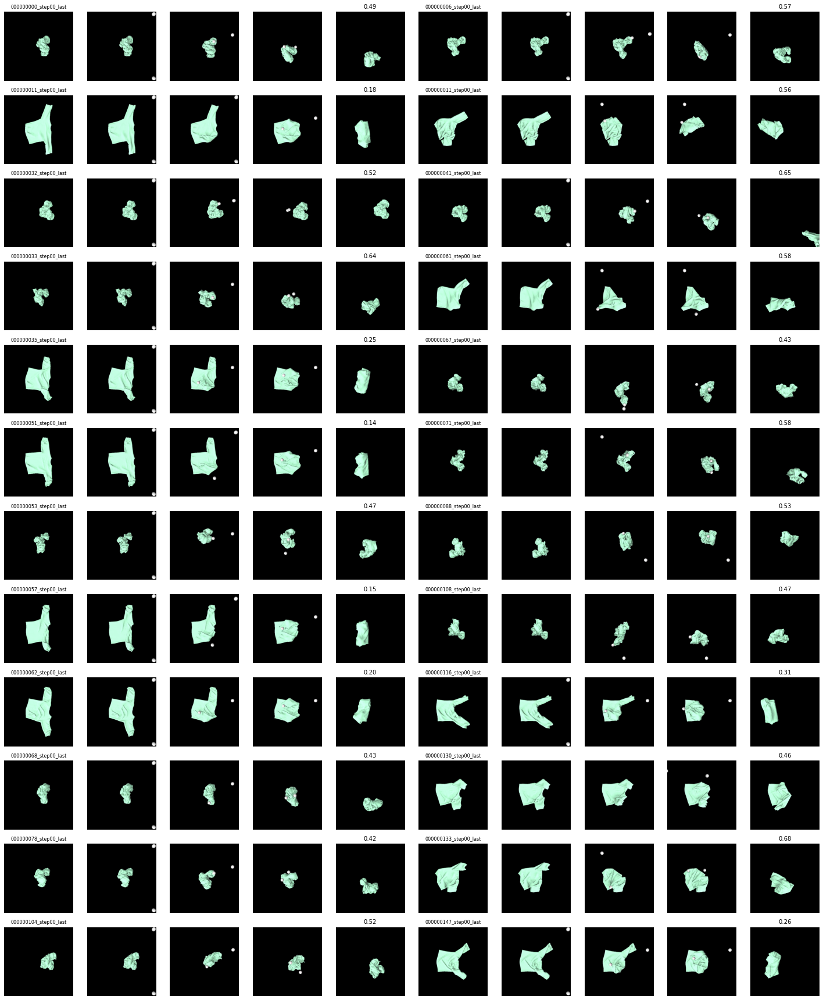

WARNING - 2022-09-02 17:25:37,512 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:38,985 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:40,408 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:41,960 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:43,345 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:44,769 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:25:46,175 - image - Clipping input data to the valid

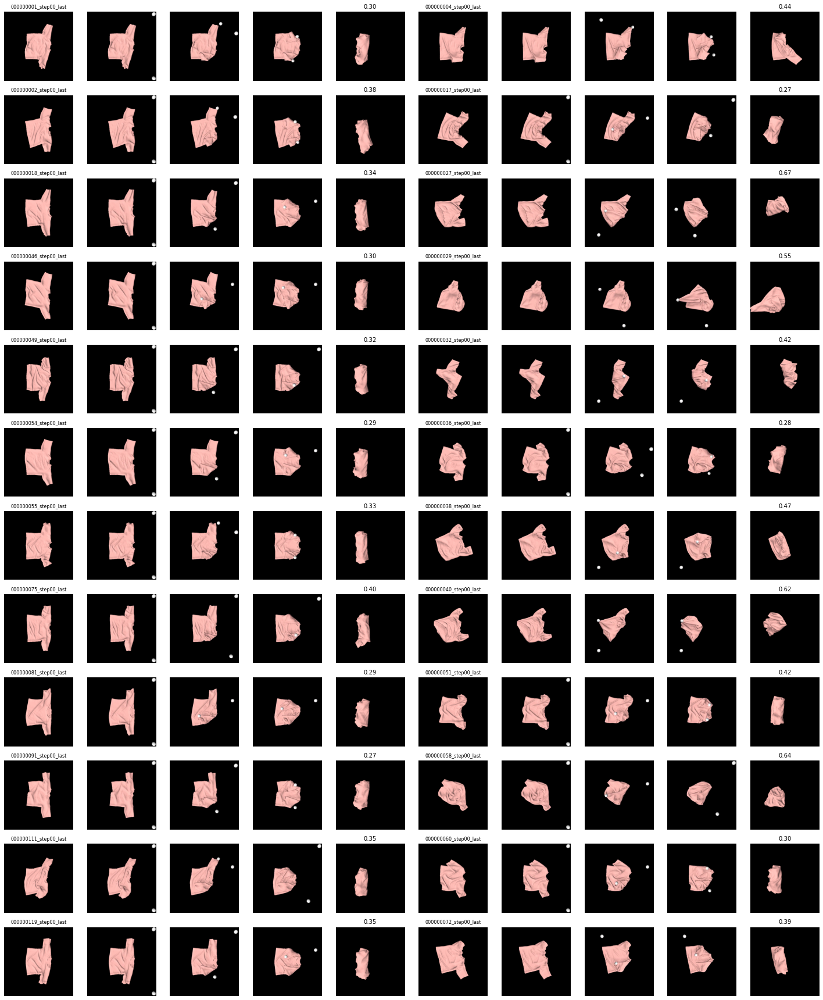

WARNING - 2022-09-02 17:26:15,209 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:16,592 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:18,039 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:19,483 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:20,867 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:22,308 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:23,678 - image - Clipping input data to the valid

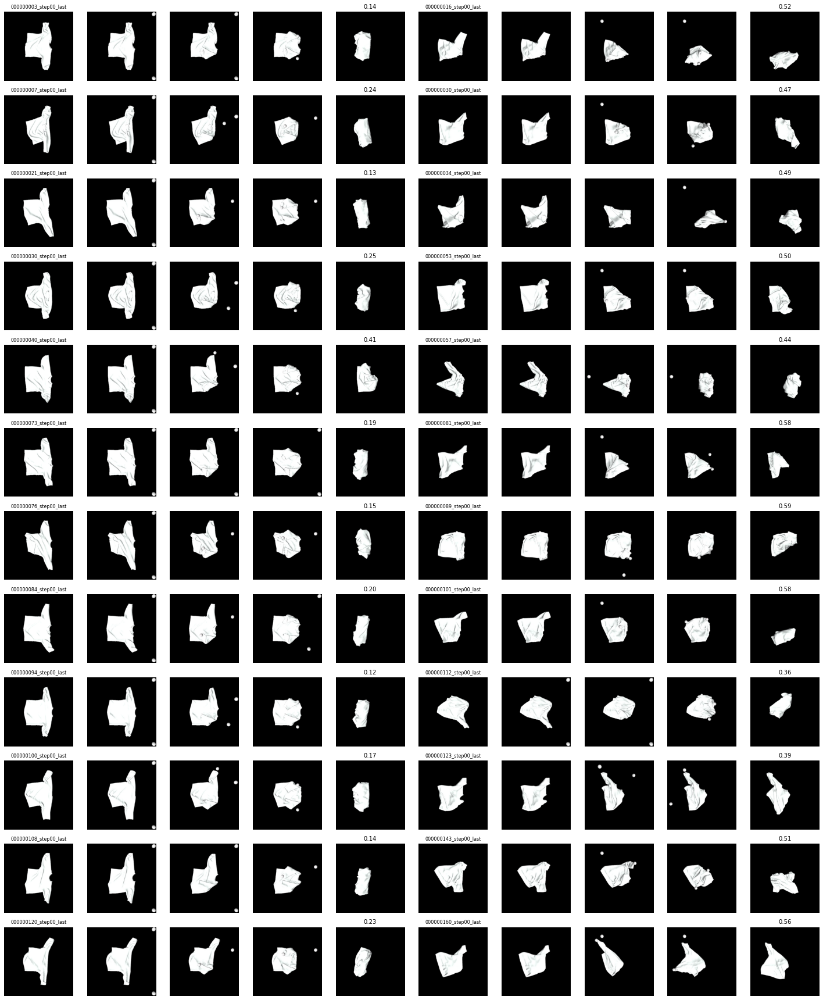

WARNING - 2022-09-02 17:26:52,171 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:53,578 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:55,073 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:56,492 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:57,924 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:26:59,396 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:00,808 - image - Clipping input data to the valid

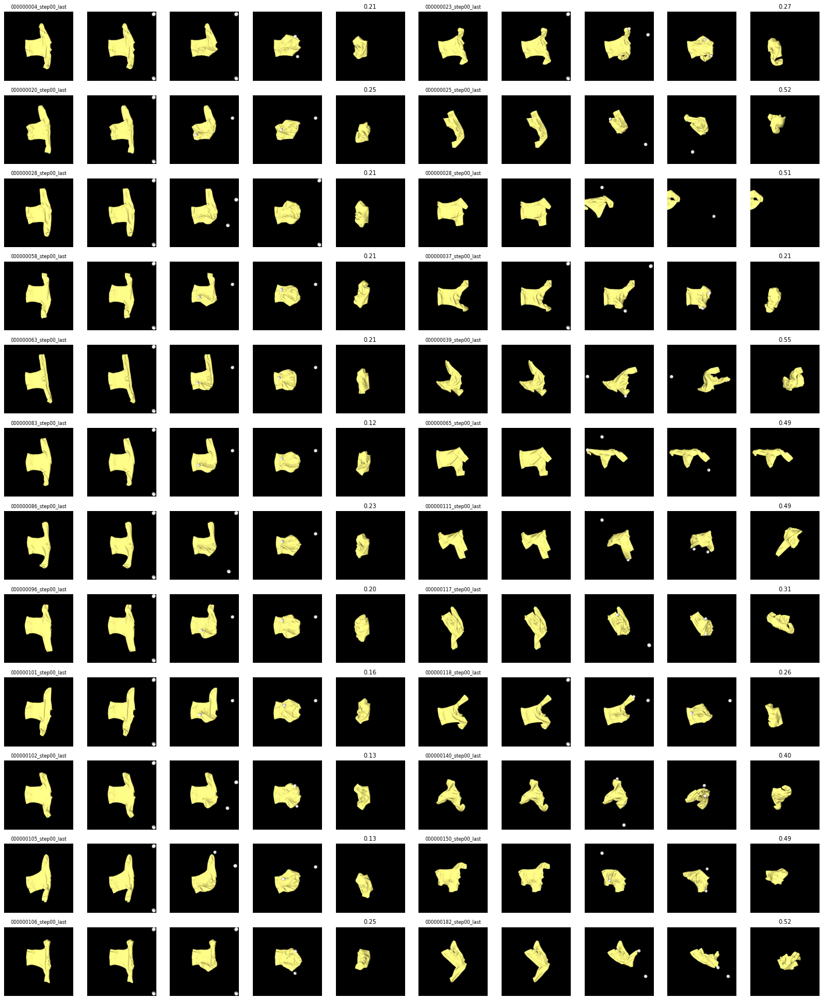

WARNING - 2022-09-02 17:27:29,093 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:30,493 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:31,883 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:33,135 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:34,437 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:35,806 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:27:37,208 - image - Clipping input data to the valid

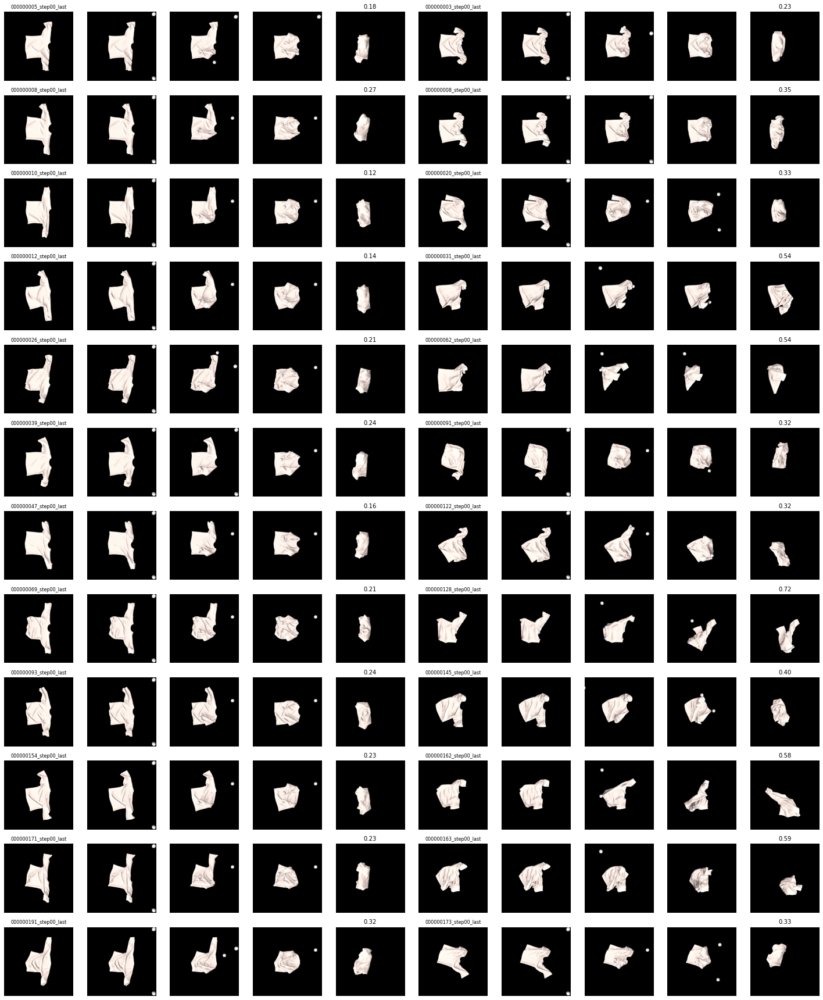

WARNING - 2022-09-02 17:28:04,845 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:06,278 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:07,825 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:09,236 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:10,601 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:12,015 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:13,436 - image - Clipping input data to the valid

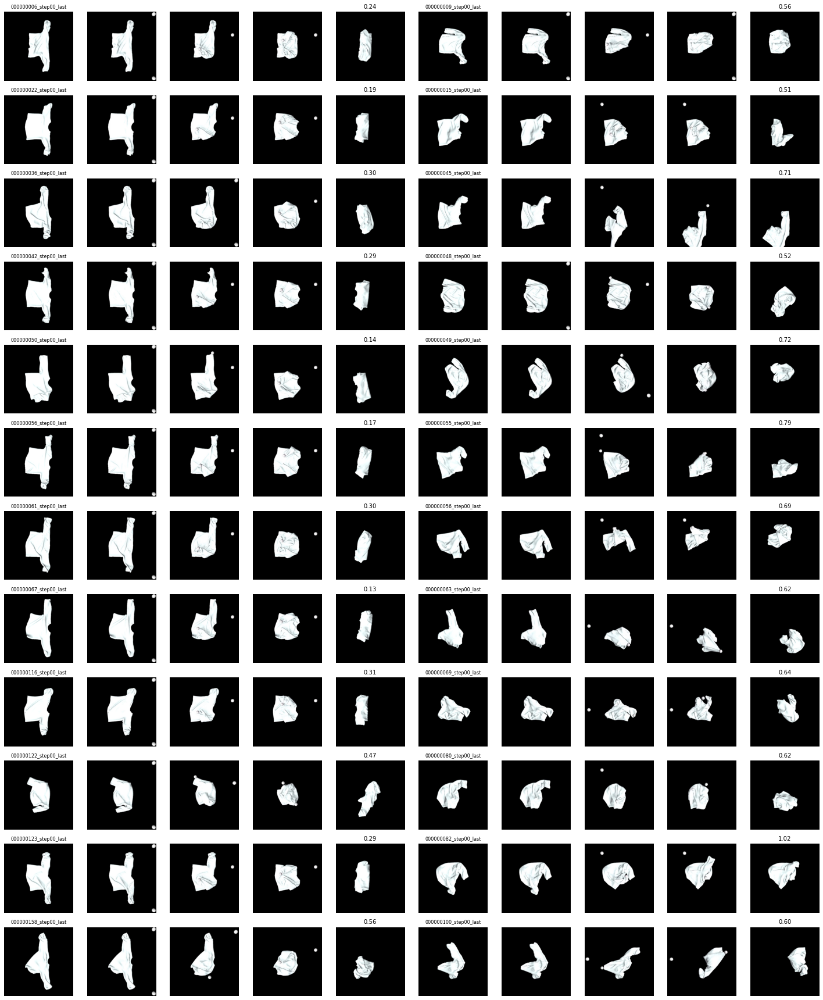

WARNING - 2022-09-02 17:28:42,292 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:43,725 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:45,162 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:46,548 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:47,921 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:49,294 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:28:50,671 - image - Clipping input data to the valid

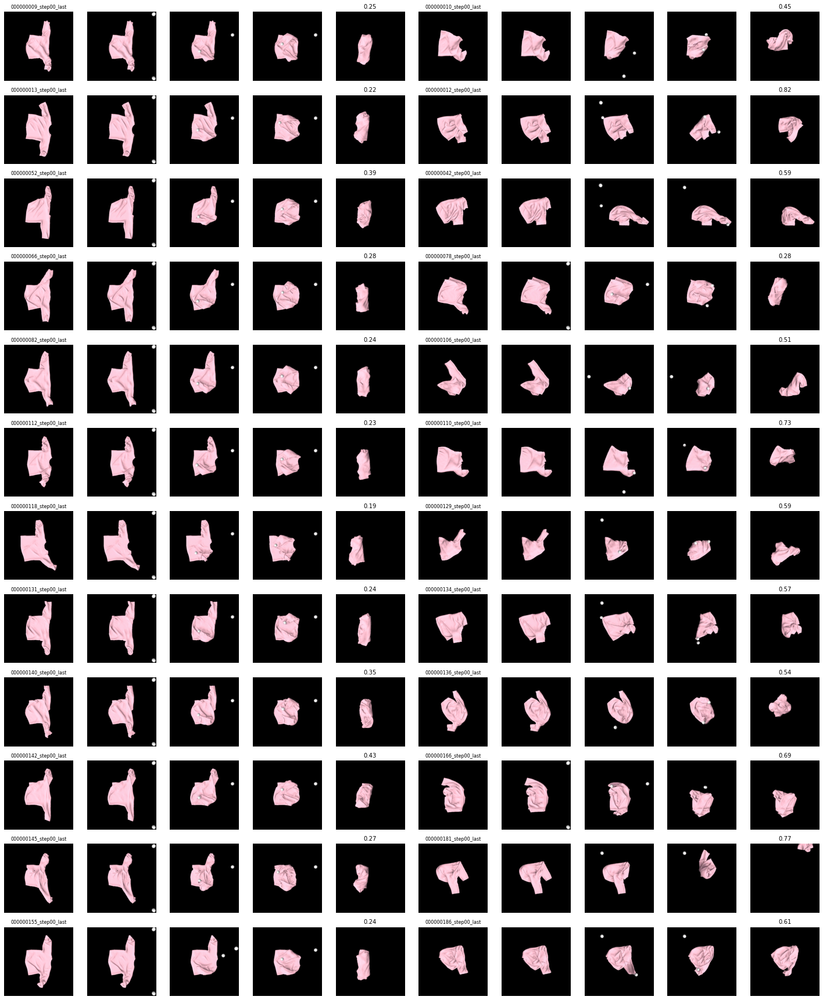

WARNING - 2022-09-02 17:29:19,210 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:20,634 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:21,987 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:23,382 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:24,759 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:26,150 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:27,555 - image - Clipping input data to the valid

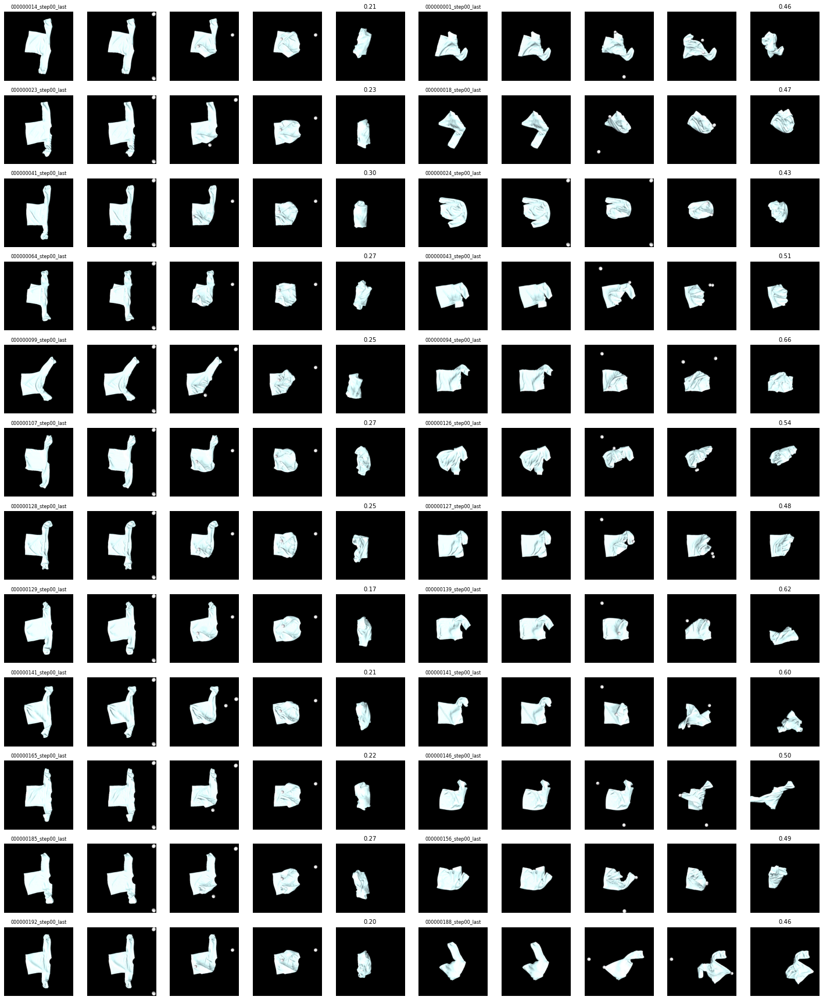

WARNING - 2022-09-02 17:29:52,468 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:53,911 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:55,346 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:56,714 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:58,095 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:29:59,483 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:00,869 - image - Clipping input data to the valid

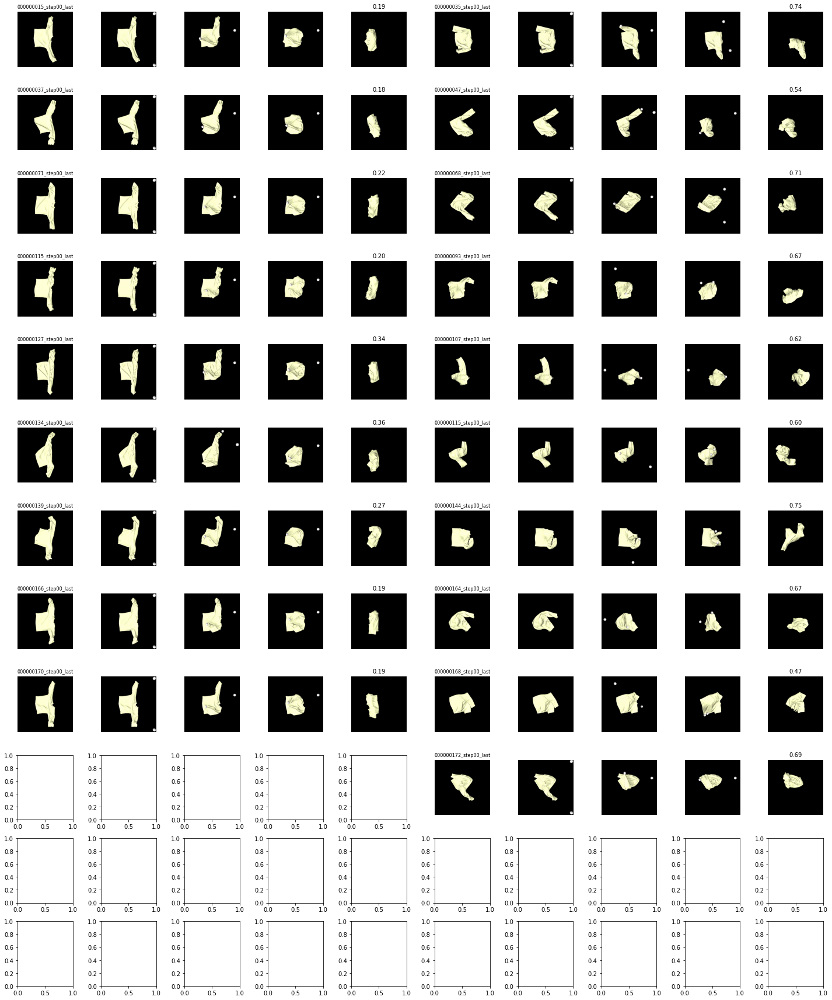

WARNING - 2022-09-02 17:30:26,589 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:28,012 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:29,426 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:30,824 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:32,256 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:33,666 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:30:35,074 - image - Clipping input data to the valid

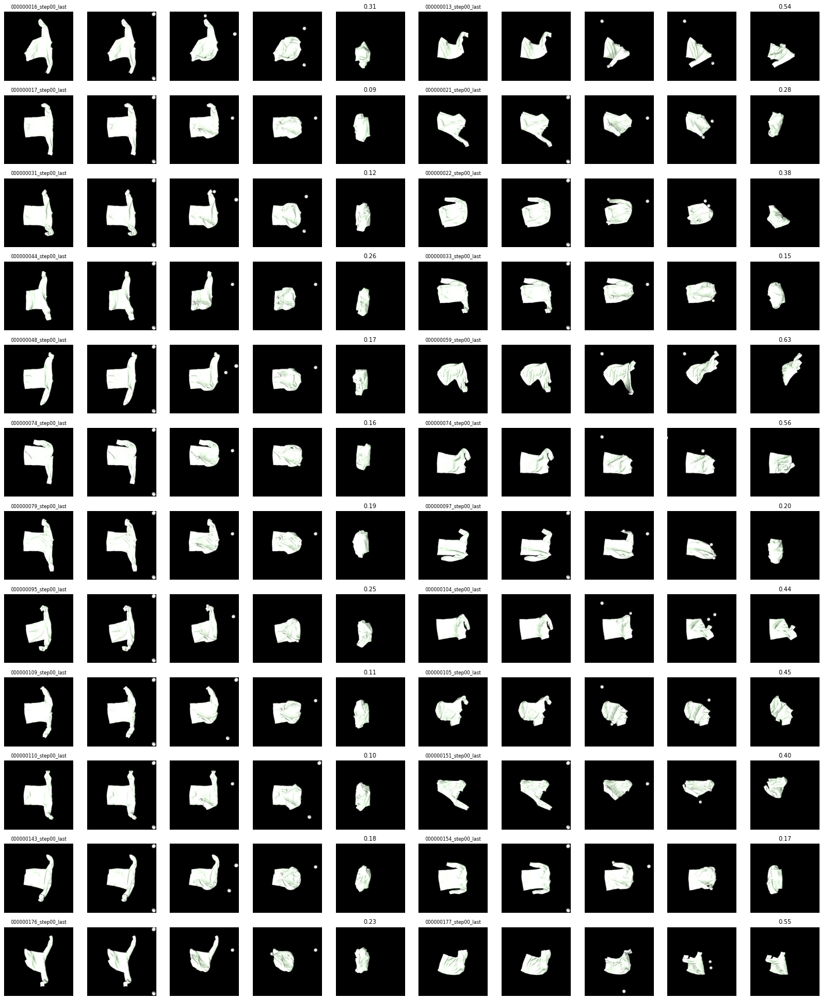

WARNING - 2022-09-02 17:30:59,899 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:31:01,272 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:31:02,660 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:31:04,038 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:31:05,441 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:31:06,811 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-02 17:31:08,182 - image - Clipping input data to the valid

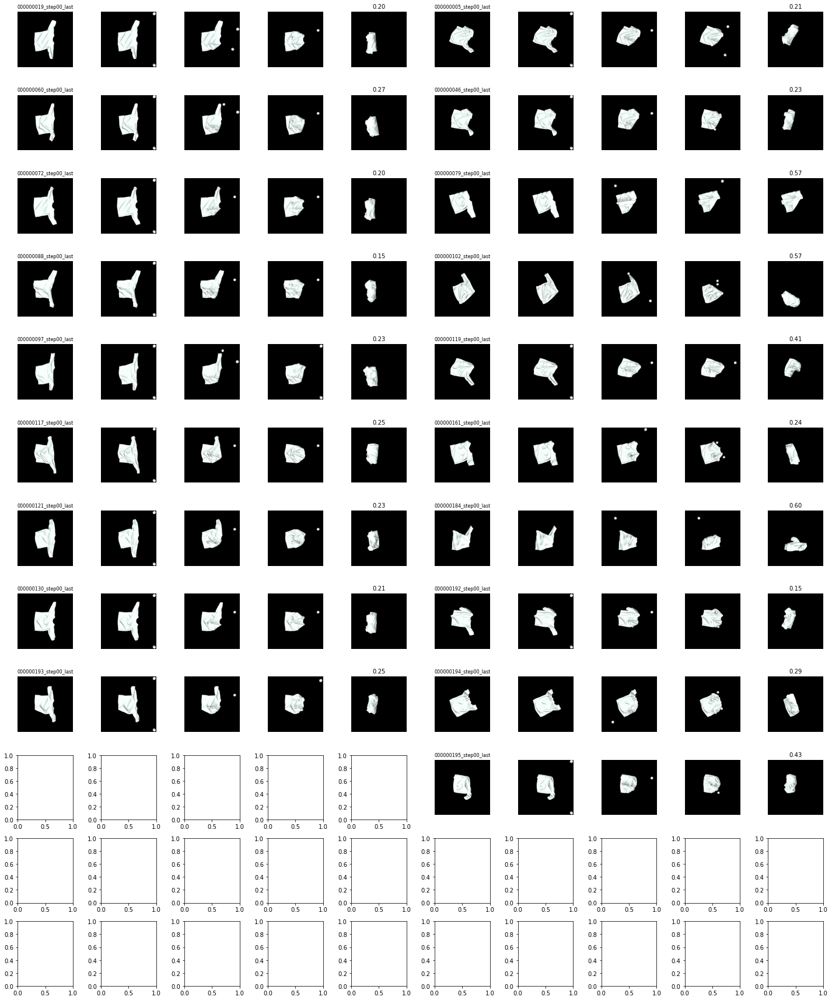

KeyboardInterrupt: 

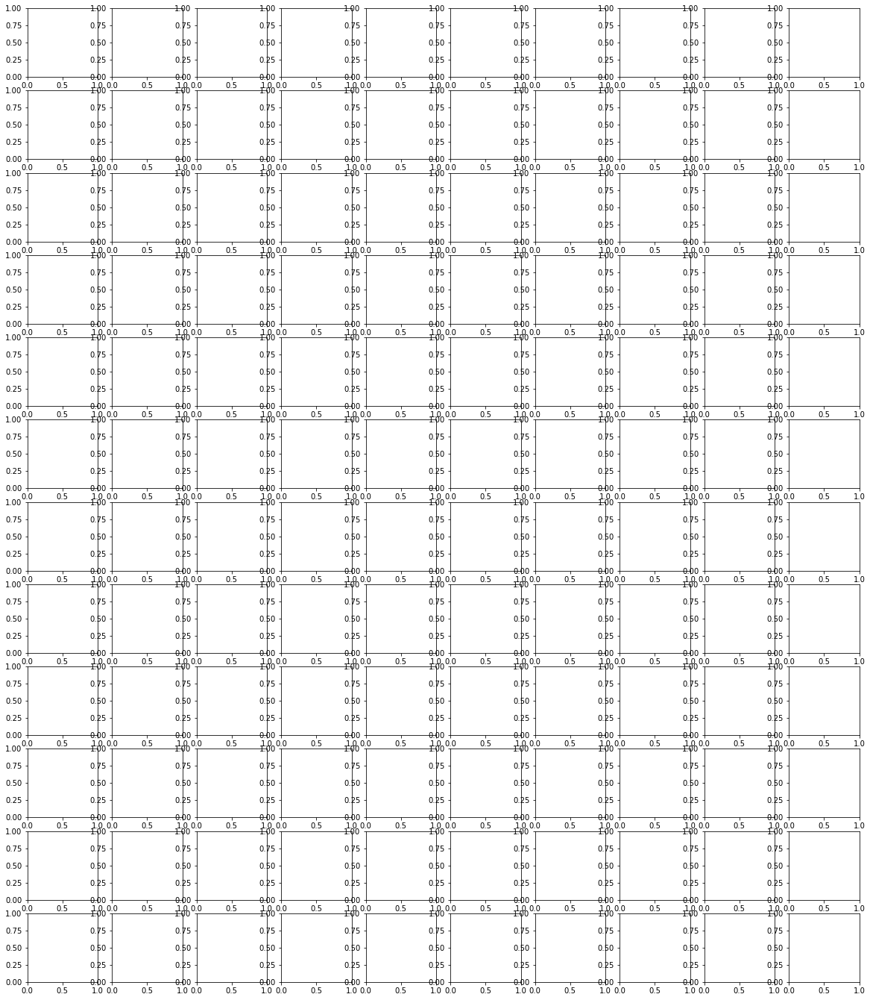

In [ ]:
import skvideo.io
import glob 
import os

num_intermediate_frames = 3
num_images = num_intermediate_frames + 2
num_examples = 12

for n, instance_query in enumerate(select_cloth_data.instance_query.unique()):
    instance_query_df = select_cloth_data[select_cloth_data.instance_query == instance_query]
    
    rows = num_examples 
    cols = num_images * 2
    
    fig, axs = plt.subplots(rows, cols, figsize=((cols*2, rows*2)))

    for i, path in enumerate(instance_query_df.path.unique()):
        path_df = instance_query_df[instance_query_df.path == path]
        for j, key in enumerate(path_df.key.unique()):
            if j == num_examples:
                break          

            preaction_img =  path_df[path_df.key == key]['pretransform_image'].values[0]
            postaction_img = path_df[path_df.key == key]['image'].values[0]
            rot = path_df[path_df.key == key]['rot'].values[0]
            l2_distance = path_df[path_df.key == key]['l2_distance'].values[0]
            deformable_distance = path_df[path_df.key == key]['deformable_distance'].values[0]
            gt_edges = path_df[path_df.key == key]['gt_mask'].values[0]

            with h5py.File(path, 'r') as dataset:
                vis_dir = os.listdir(dataset[key].attrs['visualization_dir'].replace('factoriized', 'factorized'))[0]
                videodata = skvideo.io.vread(os.path.join(dataset[key].attrs['visualization_dir'].replace('factoriized', 'factorized'), vis_dir))
                video_length = videodata.shape[0]
                #divide video into 5 equal frames
                frame_step = video_length//num_intermediate_frames
                frames = []
                for k in range(num_intermediate_frames):
                    frames.append(videodata[k*frame_step])

            if rot != -1:
                # preaction_img = np.clip(rotate(preaction_img.copy(),  -rot * (180/np.pi), reshape=False), 0, 1)
                # postaction_img = np.clip(rotate(postaction_img.copy(), -rot * (180/np.pi), reshape=False), 0, 1)
                for q in range(len(frames)):
                    frames[q] = rotate(frames[q].copy(), -rot * (180/np.pi), reshape=False)

            # postaction_img += np.stack([gt_edges]*3).transpose(1, 2, 0)
            postaction_img = np.clip(postaction_img, 0, 1)
            
            path_add = num_images * i

            axs[j, path_add].imshow(preaction_img)
            axs[j, path_add].set_axis_off()
            axs[j, path_add].set_title(key, fontsize=8)

            for x in range(len(frames)):
                idx = x+1
                axs[j, idx + path_add].imshow(frames[x])
                axs[j, idx + path_add].set_axis_off()

            axs[j, num_images-1 + path_add].imshow(postaction_img)
            axs[j, num_images-1 + path_add].set_title(f"{deformable_distance:.2f}", fontsize=10)
            axs[j, num_images-1 + path_add].set_axis_off()
    
    fig.tight_layout()
    plt.show()
    plt.close()
    
    # if n == 10:
    #     break
    


/tmp/ipykernel_212929/3739953596.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  factorized_result = select_cloth_data[select_cloth_data.name == 'factorized'][select_cloth_data.key == from_0_key]
/tmp/ipykernel_212929/3739953596.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  flingbot_result = select_cloth_data[select_cloth_data.name == 'fling'][select_cloth_data.key == from_1_key]


000000054_step00_last 000000036_step00_last


WARNING - 2022-09-14 12:10:38,208 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:38,303 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


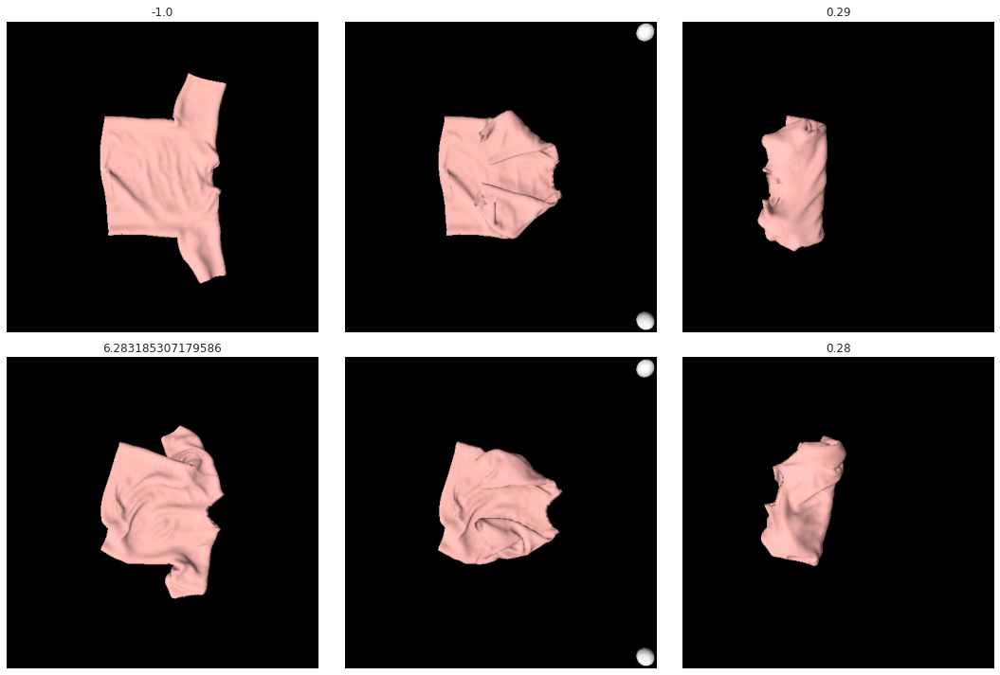

000000165_step00_last 000000024_step00_last


WARNING - 2022-09-14 12:10:41,239 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:41,333 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


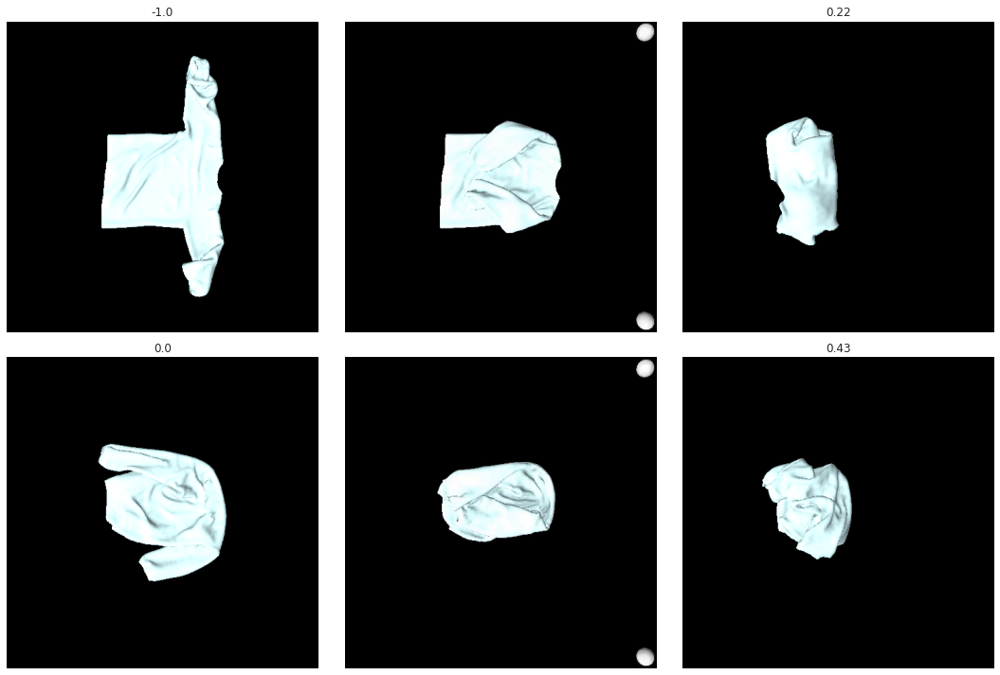

000000013_step00_last 000000136_step00_last


WARNING - 2022-09-14 12:10:44,230 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:44,316 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


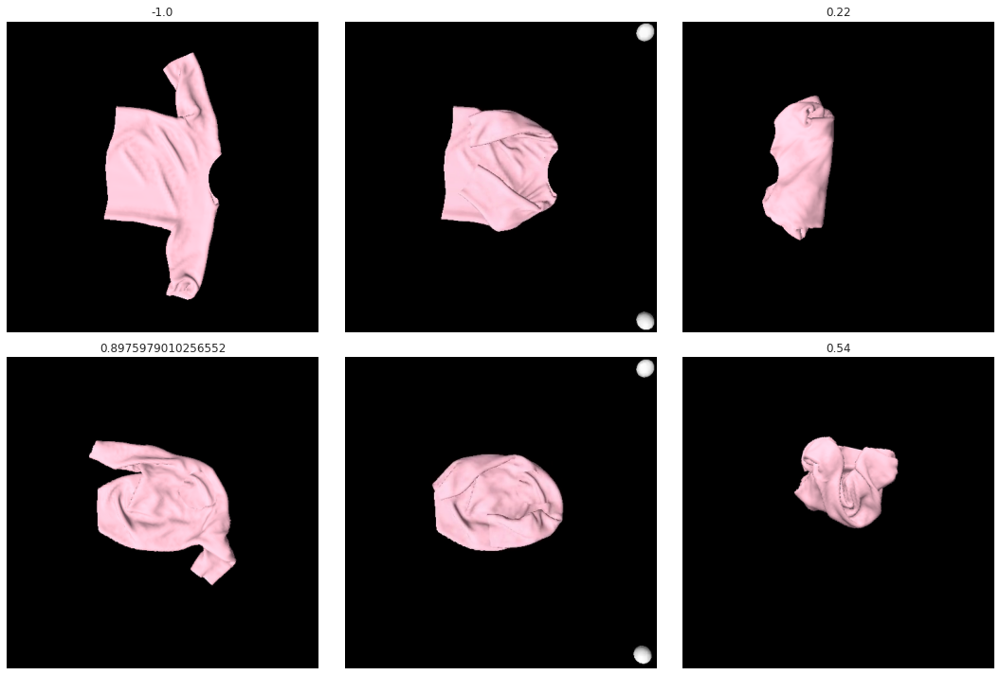

000000018_step00_last 000000058_step00_last


WARNING - 2022-09-14 12:10:47,203 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:47,297 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


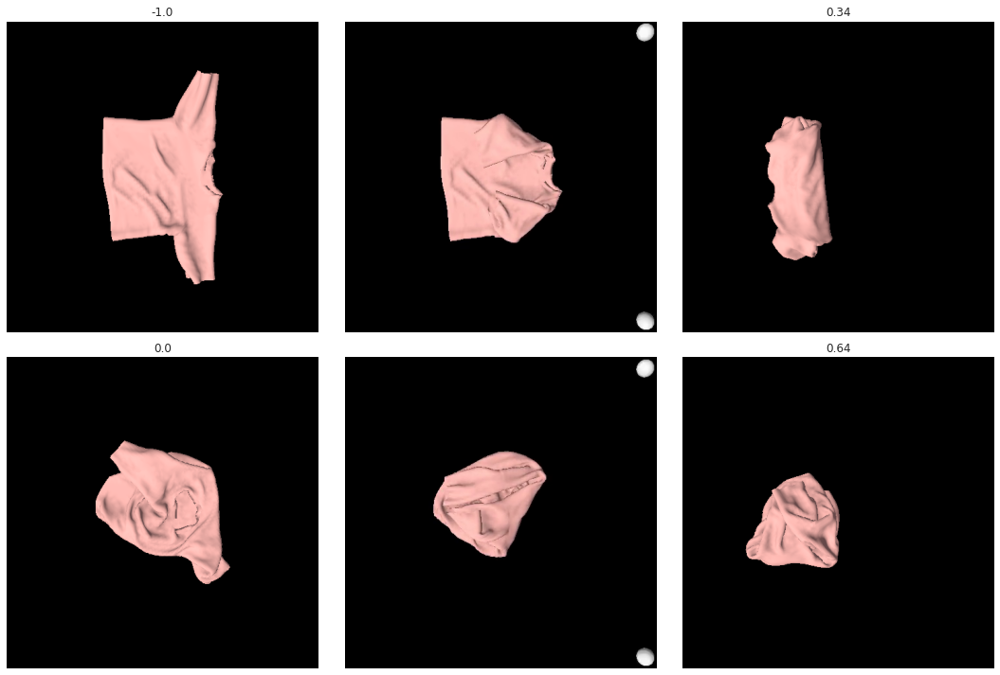

000000017_step00_last 000000022_step00_last


WARNING - 2022-09-14 12:10:50,244 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:50,336 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


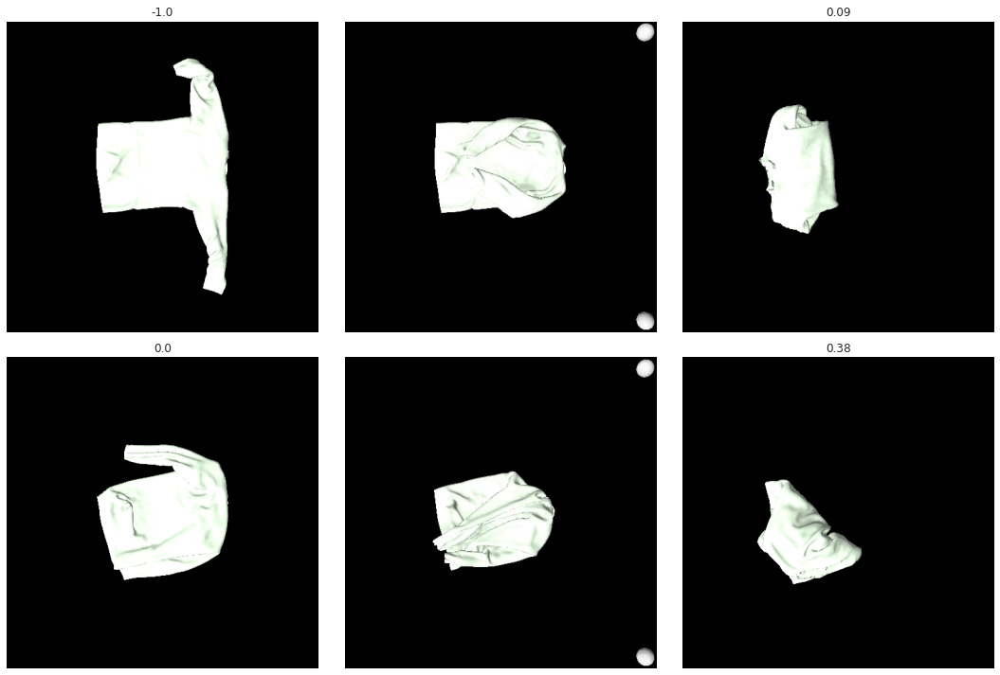

000000017_step00_last 000000059_step00_last


WARNING - 2022-09-14 12:10:53,331 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:53,419 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


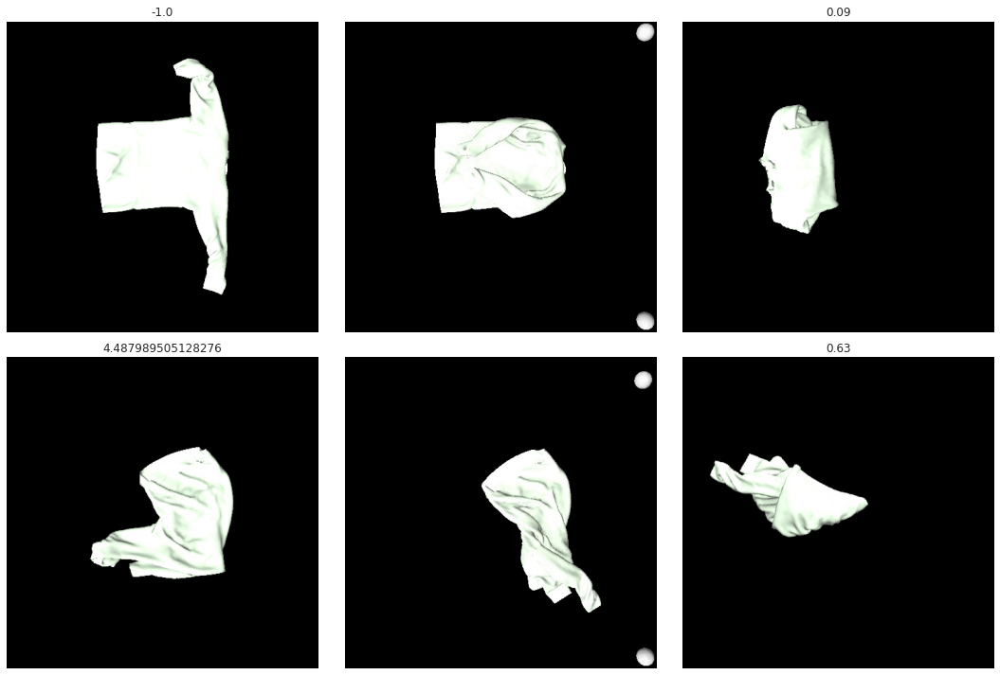

000000039_step00_last 000000122_step00_last


WARNING - 2022-09-14 12:10:56,294 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:56,385 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


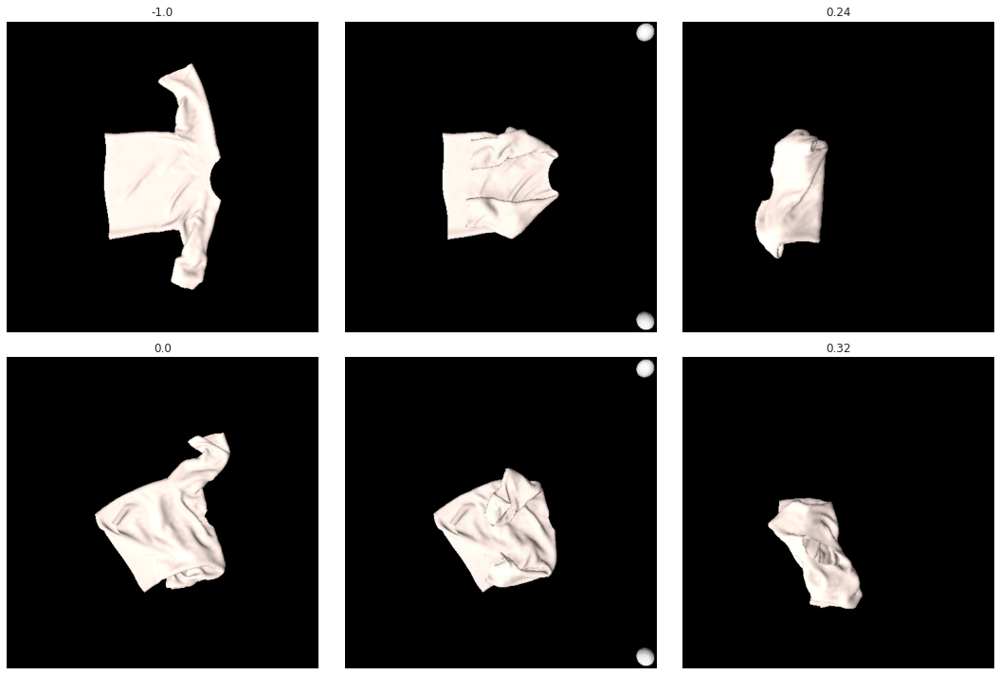

000000061_step00_last 000000082_step00_last


WARNING - 2022-09-14 12:10:59,338 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:10:59,427 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


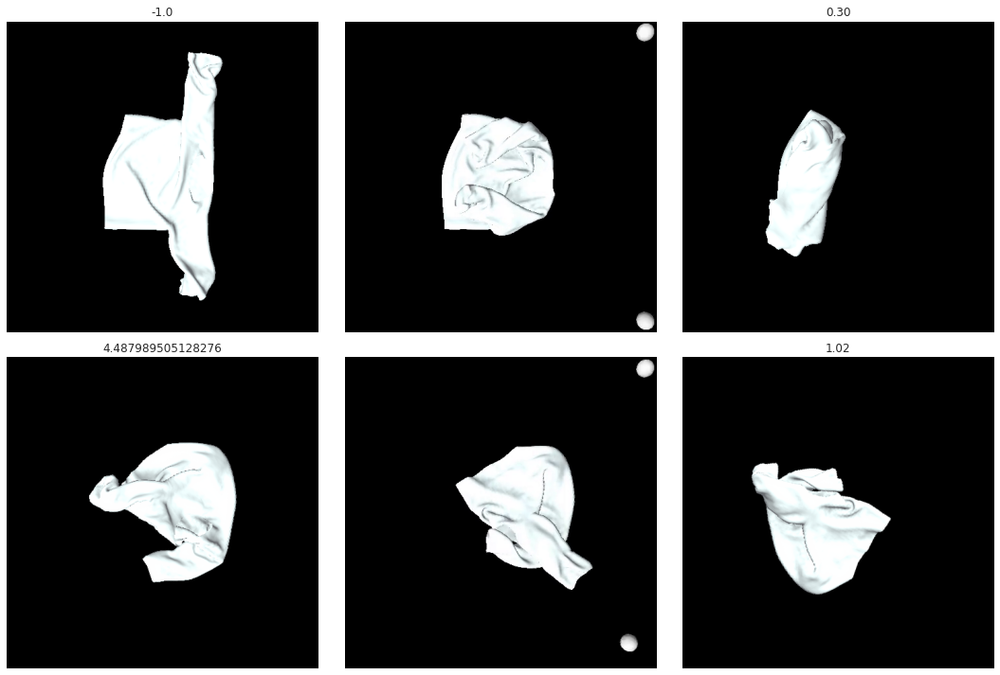

000000031_step00_last 000000022_step00_last


WARNING - 2022-09-14 12:11:02,343 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:11:02,440 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


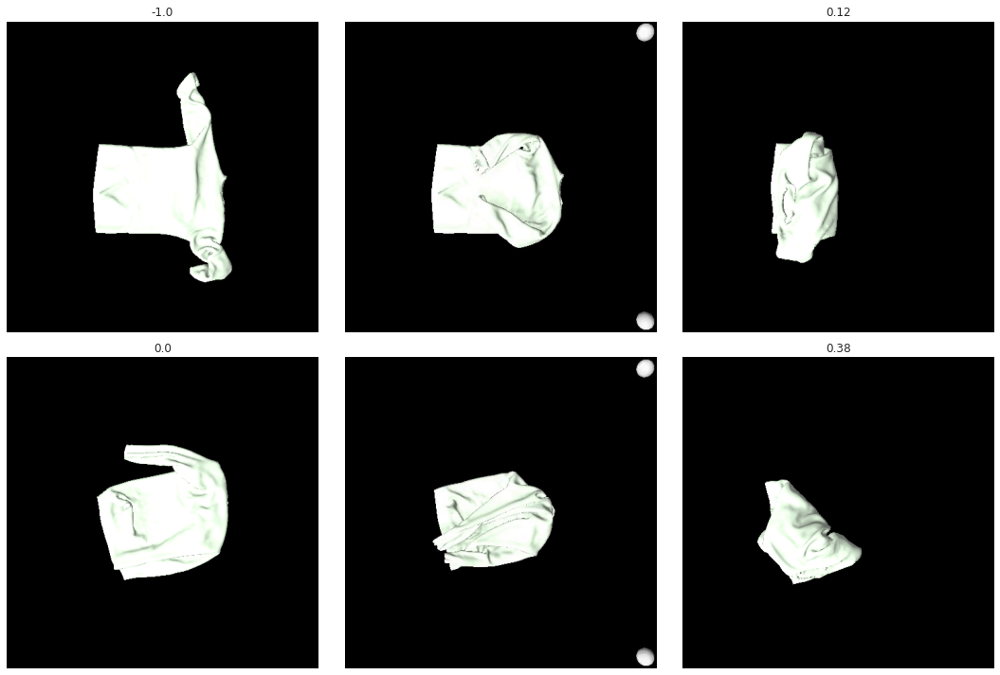

000000129_step00_last 000000024_step00_last


WARNING - 2022-09-14 12:11:05,727 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:11:05,832 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


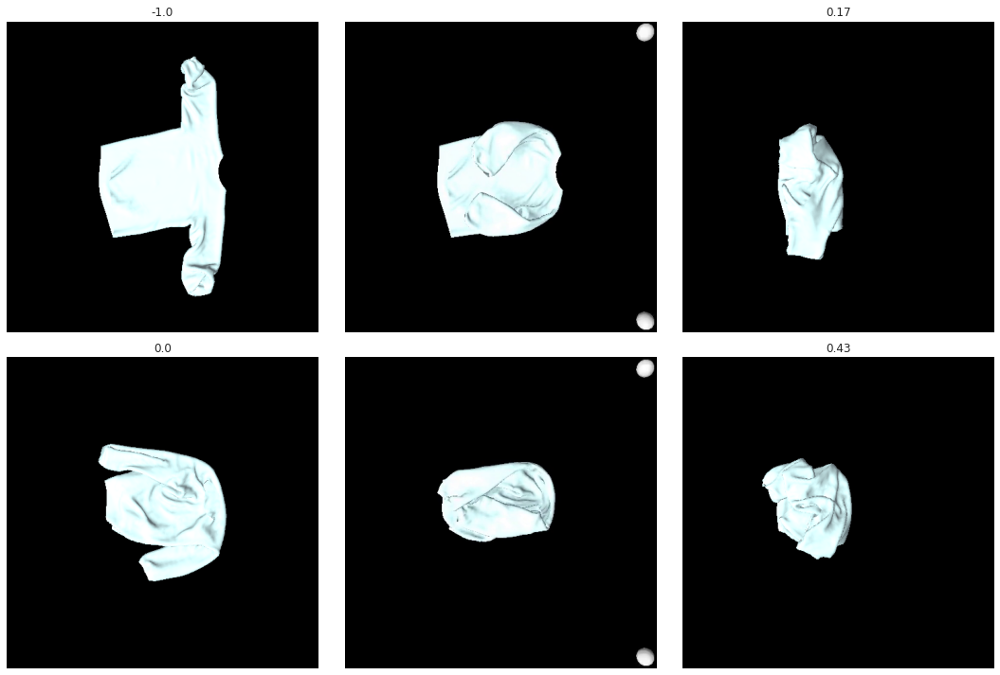

000000012_step00_last 000000008_step00_last


WARNING - 2022-09-14 12:11:08,732 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:11:08,843 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


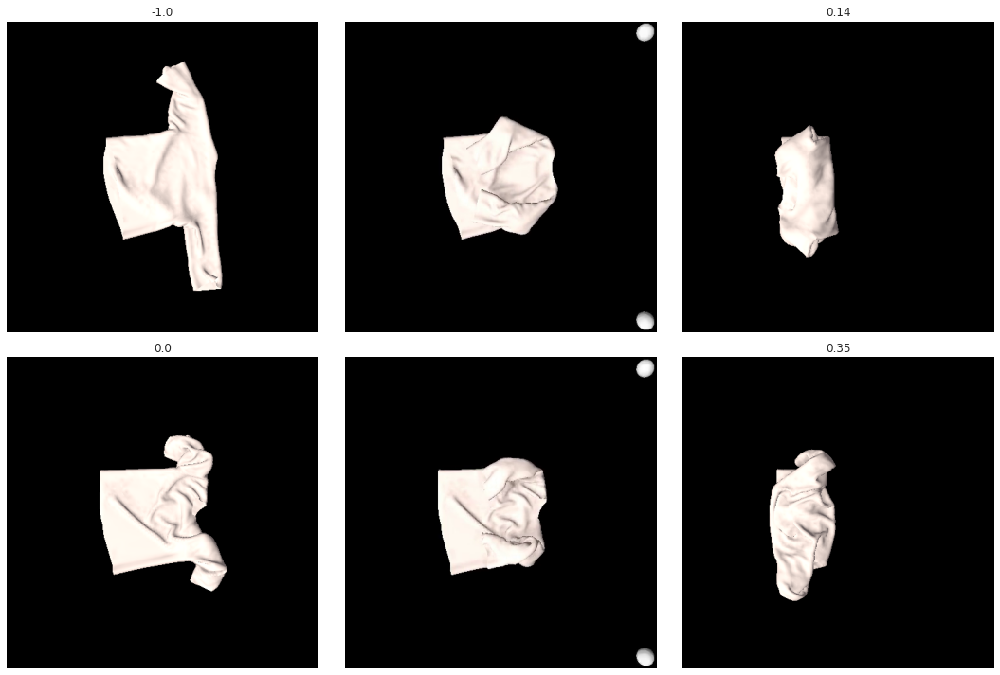

000000131_step00_last 000000134_step00_last


WARNING - 2022-09-14 12:11:11,836 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
WARNING - 2022-09-14 12:11:11,928 - image - Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


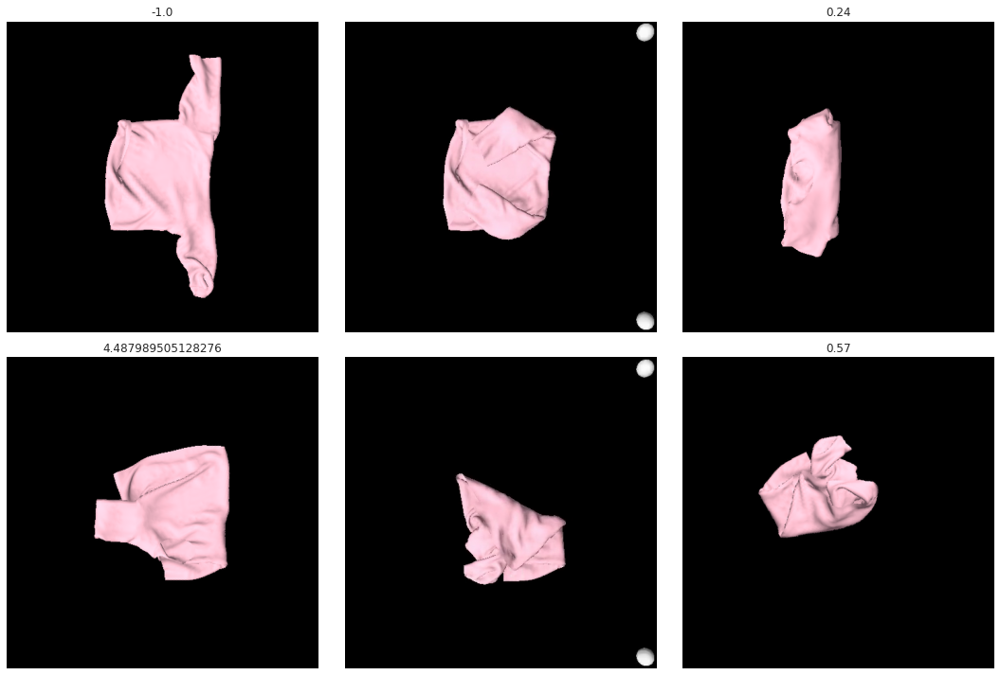

In [38]:

import skvideo.io 

pairings = {
    (17, 22), (165, 24), (18, 58), (17, 59), (54, 36), (12, 8), (39, 122), (131, 134), (13, 136), (129, 24), (31, 22), (61, 82)
}

num_intermediate_frames = 1
rows = 2
cols = num_intermediate_frames + 2
size_factor=5

for from_0, from_1 in pairings:

    # from_0, from_1 = 165, 24

    fig, axs = plt.subplots(rows, cols, figsize=(cols*size_factor, rows*size_factor))
    
    from_0_key = f"{from_0:09d}_step00_last"
    from_1_key = f"{from_1:09d}_step00_last"

    factorized_result = select_cloth_data[select_cloth_data.name == 'factorized'][select_cloth_data.key == from_0_key]
    flingbot_result = select_cloth_data[select_cloth_data.name == 'fling'][select_cloth_data.key == from_1_key]

    print(from_0_key, from_1_key)
    # print(len(factorized_result), len(flingbot_result))

    for i, result in enumerate([factorized_result, flingbot_result]):

        preaction_img = result['pretransform_image'].values[0]
        postaction_img = result['image'].values[0]
        rot = result['rot'].values[0]
        key = result['key'].values[0]
        path = result['path'].values[0]
        postaction_deformable = result['deformable_distance'].values[0]
        postaction_l2 = result['l2_distance'].values[0]

        rot = result['rot'].values[0]


        with h5py.File(path, 'r') as dataset:


            vis_dir = os.listdir(dataset[key].attrs['visualization_dir'].replace('factoriized', 'factorized'))[0]
            videodata = skvideo.io.vread(os.path.join(dataset[key].attrs['visualization_dir'].replace('factoriized', 'factorized'), vis_dir))
            video_length = videodata.shape[0]
            
            #divide video into 5 equal frames
            frames = []
            for j, frame in enumerate(videodata):
                test_frame = frame.copy()
                test_frame[int(frame.shape[0]*0.1):int(frame.shape[0]*0.9), int(frame.shape[0]*0):int(frame.shape[0]*0.9)] = 0
                condition_number = np.mean(test_frame)
                if condition_number > 1 and j > videodata.shape[0]//2:
                # if j % 8 == 0:
                    frames.append(frame)
                    break
                    # frames.append(videodata[k*frame_step])
            # MARGIN = 5
        
        if rot != -1:
            preaction_img = rotate(preaction_img.copy(), rot * (180/np.pi), reshape=False)

        axs[i, 0].imshow(preaction_img)
        axs[i, 0].set_title(rot)
        axs[i, 0].set_axis_off()

        for x in range(len(frames)):
            idx = x+1
            axs[i, idx].imshow(frames[x])
            axs[i, idx].set_axis_off()
        

        if rot != -1:
            postaction_img = rotate(postaction_img.copy(), -rot * (180/np.pi), reshape=False)

        axs[i, num_intermediate_frames+1].imshow(postaction_img)
        axs[i, num_intermediate_frames+1].set_axis_off()
        axs[i, num_intermediate_frames+1].set_title(f"{postaction_deformable:.2f}")


    fig.tight_layout()
    plt.show()

    if i == 2:
        break

    
    
